# **Space X  Falcon 9 First Stage Landing Prediction**


## Machine Learning Prediction

Space X advertises Falcon 9 rocket launches on its website with a cost of 62 million dollars; other providers cost upward of 165 million dollars each, much of the savings is because Space X can reuse the first stage. Therefore if we can determine if the first stage will land, we can determine the cost of a launch. This information can be used if an alternate company wants to bid against space X for a rocket launch.   Here we will create a machine learning pipeline  to predict if the first stage will land or not.

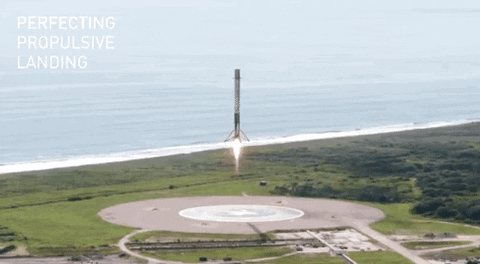

Several examples of an unsuccessful landing are shown here:
Most unsuccessful landings are planed. Space X; performs a controlled landing in the oceans.


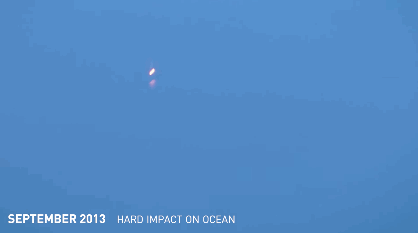

### Import Libraries and Define Auxiliary Functions

In [1]:
# Pandas is a software library written for the Python programming language for data manipulation and analysis.
import pandas as pd
# NumPy is a library for the Python programming language, adding support for large, multi-dimensional arrays and matrices, along with a large collection of high-level mathematical functions to operate on these arrays
import numpy as np
# Matplotlib is a plotting library for python and pyplot gives us a MatLab like plotting framework. We will use this in our plotter function to plot data.
import matplotlib.pyplot as plt
#Seaborn is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics
import seaborn as sns
# Preprocessing allows us to standarsize our data
from sklearn import preprocessing
# Allows us to split our data into training and testing data
from sklearn.model_selection import train_test_split
# Allows us to test parameters of classification algorithms and find the best one
from sklearn.model_selection import GridSearchCV
# Logistic Regression classification algorithm
from sklearn.linear_model import LogisticRegression
# Support Vector Machine classification algorithm
from sklearn.svm import SVC
# Decision Tree classification algorithm
from sklearn.tree import DecisionTreeClassifier
# K Nearest Neighbors classification algorithm
from sklearn.neighbors import KNeighborsClassifier

## This function is to plot the confusion matrix for the project.


In [2]:
def plot_confusion_matrix(y,y_predict):
    "this function plots the confusion matrix"
    from sklearn.metrics import confusion_matrix

    cm = confusion_matrix(y, y_predict)
    ax= plt.subplot()
    sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells
    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title('Confusion Matrix'); 
    ax.xaxis.set_ticklabels(['did not land', 'land']); ax.yaxis.set_ticklabels(['did not land', 'landed'])

In [3]:
df= pd.read_csv('E:\DataRoadMap\week_10\preprocessed_dataset.csv')
df.head()

,Unnamed: 0,PayloadMass,Flights,GridFins,Reused,Legs,Block,ReusedCount,Class,Orbit_ES-L1,...,Serial_B1048,Serial_B1049,Serial_B1050,Serial_B1051,Serial_B1054,Serial_B1056,Serial_B1058,Serial_B1059,Serial_B1060,Serial_B1062
0,0,6104.959412,1,0,0,0,1.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,525.000000,1,0,0,0,1.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,677.000000,1,0,0,0,1.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,500.000000,1,0,0,0,1.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,3170.000000,1,0,0,0,1.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90 entries, 0 to 89
Data columns (total 89 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Unnamed: 0                           90 non-null     int64  
 1   PayloadMass                          90 non-null     float64
 2   Flights                              90 non-null     int64  
 3   GridFins                             90 non-null     int64  
 4   Reused                               90 non-null     int64  
 5   Legs                                 90 non-null     int64  
 6   Block                                90 non-null     float64
 7   ReusedCount                          90 non-null     int64  
 8   Class                                90 non-null     int64  
 9   Orbit_ES-L1                          90 non-null     int64  
 10  Orbit_GEO                            90 non-null     int64  
 11  Orbit_GTO                         

##  We already preprocessed dataset, this notebook is only for selecting best machine learning models



### Defining X , Y

In [13]:
x=df.drop('Class',axis=1)
y=df['Class']

In [7]:
y

0     0
1     0
2     0
3     0
4     0
     ..
85    1
86    1
87    1
88    1
89    1
Name: Class, Length: 90, dtype: int64

In [8]:
x

,Unnamed: 0,PayloadMass,Flights,GridFins,Reused,Legs,Block,ReusedCount,Orbit_ES-L1,Orbit_GEO,...,Serial_B1048,Serial_B1049,Serial_B1050,Serial_B1051,Serial_B1054,Serial_B1056,Serial_B1058,Serial_B1059,Serial_B1060,Serial_B1062
0,0,6104.959412,1,0,0,0,1.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,525.000000,1,0,0,0,1.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,677.000000,1,0,0,0,1.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,500.000000,1,0,0,0,1.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,3170.000000,1,0,0,0,1.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,85,15400.000000,2,1,1,1,5.0,2,0,0,...,0,0,0,0,0,0,0,0,1,0
86,86,15400.000000,3,1,1,1,5.0,2,0,0,...,0,0,0,0,0,0,1,0,0,0
87,87,15400.000000,6,1,1,1,5.0,5,0,0,...,0,0,0,1,0,0,0,0,0,0
88,88,15400.000000,3,1,1,1,5.0,2,0,0,...,0,0,0,0,0,0,0,0,1,0


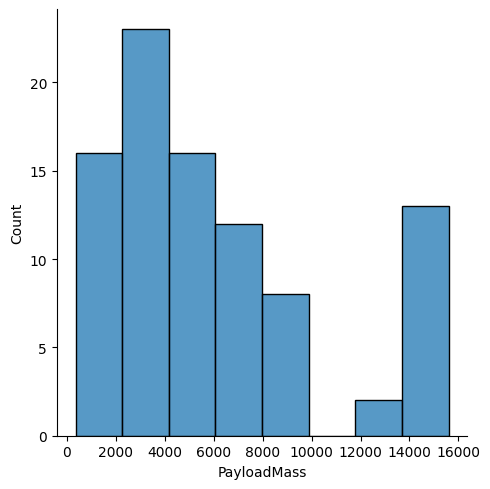

In [14]:
sns.displot(data=x, x='PayloadMass')

## Standardize Features


#### some of the columns are not standard

In [15]:
transform = preprocessing.StandardScaler()
x_scaled = transform.fit_transform(x)
x_scaled

array([[-1.71291154e+00, -1.94814463e-16, -6.53912840e-01, ...,
        -2.15665546e-01, -1.85695338e-01, -1.05999788e-01],
       [-1.67441914e+00, -1.19523159e+00, -6.53912840e-01, ...,
        -2.15665546e-01, -1.85695338e-01, -1.05999788e-01],
       [-1.63592675e+00, -1.16267307e+00, -6.53912840e-01, ...,
        -2.15665546e-01, -1.85695338e-01, -1.05999788e-01],
       ...,
       [ 1.63592675e+00,  1.99100483e+00,  3.49060516e+00, ...,
        -2.15665546e-01, -1.85695338e-01, -1.05999788e-01],
       [ 1.67441914e+00,  1.99100483e+00,  1.00389436e+00, ...,
        -2.15665546e-01,  5.38516481e+00, -1.05999788e-01],
       [ 1.71291154e+00, -5.19213966e-01, -6.53912840e-01, ...,
        -2.15665546e-01, -1.85695338e-01,  9.43398113e+00]])

In [16]:
col=x.columns
x=pd.DataFrame(x_scaled, columns=col)
x

,Unnamed: 0,PayloadMass,Flights,GridFins,Reused,Legs,Block,ReusedCount,Orbit_ES-L1,Orbit_GEO,...,Serial_B1048,Serial_B1049,Serial_B1050,Serial_B1051,Serial_B1054,Serial_B1056,Serial_B1058,Serial_B1059,Serial_B1060,Serial_B1062
0,-1.712912,-1.948145e-16,-0.653913,-1.870829,-0.835532,-1.933091,-1.575895,-0.973440,-0.106,-0.106,...,-0.215666,-0.267261,-0.106,-0.242536,-0.106,-0.215666,-0.185695,-0.215666,-0.185695,-0.106000
1,-1.674419,-1.195232e+00,-0.653913,-1.870829,-0.835532,-1.933091,-1.575895,-0.973440,-0.106,-0.106,...,-0.215666,-0.267261,-0.106,-0.242536,-0.106,-0.215666,-0.185695,-0.215666,-0.185695,-0.106000
2,-1.635927,-1.162673e+00,-0.653913,-1.870829,-0.835532,-1.933091,-1.575895,-0.973440,-0.106,-0.106,...,-0.215666,-0.267261,-0.106,-0.242536,-0.106,-0.215666,-0.185695,-0.215666,-0.185695,-0.106000
3,-1.597434,-1.200587e+00,-0.653913,-1.870829,-0.835532,-1.933091,-1.575895,-0.973440,-0.106,-0.106,...,-0.215666,-0.267261,-0.106,-0.242536,-0.106,-0.215666,-0.185695,-0.215666,-0.185695,-0.106000
4,-1.558942,-6.286706e-01,-0.653913,-1.870829,-0.835532,-1.933091,-1.575895,-0.973440,-0.106,-0.106,...,-0.215666,-0.267261,-0.106,-0.242536,-0.106,-0.215666,-0.185695,-0.215666,-0.185695,-0.106000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,1.558942,1.991005e+00,0.174991,0.534522,1.196843,0.517306,0.945537,0.202528,-0.106,-0.106,...,-0.215666,-0.267261,-0.106,-0.242536,-0.106,-0.215666,-0.185695,-0.215666,5.385165,-0.106000
86,1.597434,1.991005e+00,1.003894,0.534522,1.196843,0.517306,0.945537,0.202528,-0.106,-0.106,...,-0.215666,-0.267261,-0.106,-0.242536,-0.106,-0.215666,5.385165,-0.215666,-0.185695,-0.106000
87,1.635927,1.991005e+00,3.490605,0.534522,1.196843,0.517306,0.945537,1.966480,-0.106,-0.106,...,-0.215666,-0.267261,-0.106,4.123106,-0.106,-0.215666,-0.185695,-0.215666,-0.185695,-0.106000
88,1.674419,1.991005e+00,1.003894,0.534522,1.196843,0.517306,0.945537,0.202528,-0.106,-0.106,...,-0.215666,-0.267261,-0.106,-0.242536,-0.106,-0.215666,-0.185695,-0.215666,5.385165,-0.106000


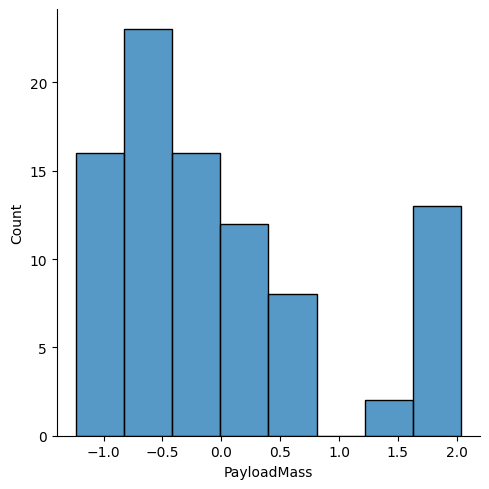

In [17]:
sns.displot(data=x, x='PayloadMass')

#### As you can see these plot do not have any difference. it shows these data are only standardized not changed. 

## Train- Test Split


In [18]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.3, random_state=101)



## 1) Logistic Regression

In [19]:
lr=LogisticRegression()
parameters={'C':[0.01,0.1,1],'penalty':['l2'],'solver':['lbfgs']}
logreg_cv=GridSearchCV(lr,parameters,cv=4)
logreg_cv.fit(x_train,y_train)

GridSearchCV(cv=4, estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1], 'penalty': ['l2'],
                         'solver': ['lbfgs']})

In [20]:
print(logreg_cv.best_score_)
print(logreg_cv.best_params_)

0.875
{'C': 1, 'penalty': 'l2', 'solver': 'lbfgs'}


### create 2 list for keeping all models names and scores

In [21]:
accu = []
methods = []

#### adding first methos(Logistic Regression)on the lists

In [22]:
accu.append(logreg_cv.score(x_test,y_test))
methods.append("Logistic Regression")

In [23]:
accu

[0.8888888888888888]

In [24]:
methods

['Logistic Regression']

### Confusion Matrix (for Logistic Regression)

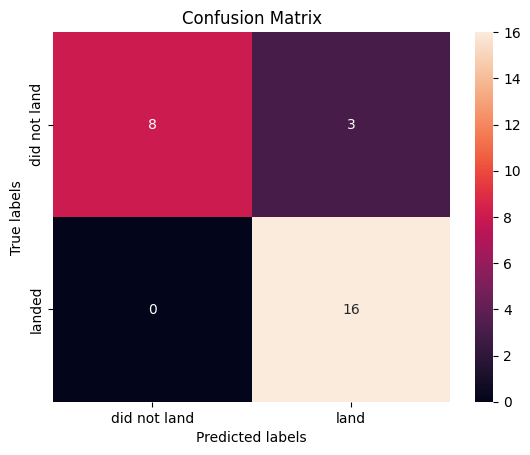

In [25]:
yhat=logreg_cv.predict(x_test)
plot_confusion_matrix(y_test,yhat)

## 2)Support Vector Machine

In [26]:
parameters = {'kernel':('linear','rbf','poly','rbf','sigmoid'),'C':(0.5,1,1.5)}
svm=SVC()

In [27]:
svm_cv=GridSearchCV(svm,parameters,cv=10)
svm_cv.fit(x_train,y_train)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid={'C': (0.5, 1, 1.5),
                         'kernel': ('linear', 'rbf', 'poly', 'rbf', 'sigmoid')})

In [28]:
print(svm_cv.best_params_)
print(svm_cv.best_score_)

{'C': 1, 'kernel': 'sigmoid'}
0.9380952380952381


#### adding first methos(SVM)on the lists

In [29]:
accu.append(svm_cv.score(x_test,y_test))
methods.append('Support Vector Machine')

In [30]:
accu

[0.8888888888888888, 0.8888888888888888]

In [31]:
methods

['Logistic Regression', 'Support Vector Machine']

## Confusion Martix (for SVM)

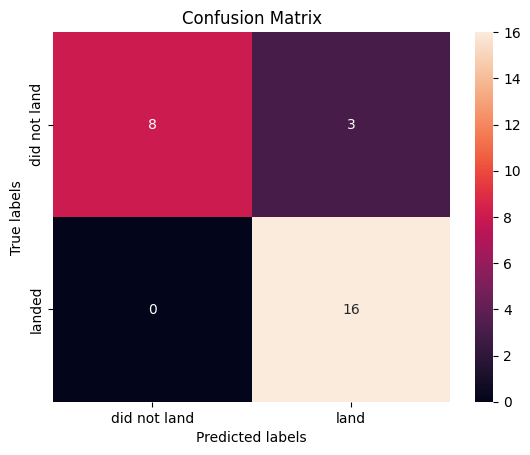

In [32]:
yhat=svm_cv.predict(x_test)
plot_confusion_matrix(y_test,yhat)

## 3) Decision Trees 

In [33]:
parameters = {'criterion': ['gini', 'entropy'],
     'splitter': ['best', 'random'],
     'max_depth': [2*n for n in range(1,10)],
     'max_features': ['auto', 'sqrt'],
     'min_samples_leaf': [1, 2, 4],
     'min_samples_split': [2, 5, 10]}

tree = DecisionTreeClassifier()

In [34]:
tree_cv= GridSearchCV(tree,parameters,cv=10)
tree_cv.fit(x_train,y_train)

C:\Users\kaveh\pythonlab\Lib\site-packages\sklearn\tree\_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
C:\Users\kaveh\pythonlab\Lib\site-packages\sklearn\tree\_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
C:\Users\kaveh\pythonlab\Lib\site-packages\sklearn\tree\_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
C:\Users\kaveh\pythonlab\Lib\site-packages\sklearn\tree\_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
C:\Users

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, 12, 14, 16, 18],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'splitter': ['best', 'random']})

In [36]:
print(tree_cv.best_score_)
tree_cv.best_params_

0.9833333333333334


{'criterion': 'gini',
 'max_depth': 16,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'random'}

#### adding first methos(Decision Trees)on the lists

In [37]:
accu.append(tree_cv.score(x_test,y_test))
methods.append('Decision Tree Classifier')

In [38]:
accu

[0.8888888888888888, 0.8888888888888888, 0.8148148148148148]

In [39]:
methods

['Logistic Regression', 'Support Vector Machine', 'Decision Tree Classifier']

## Confusion Matrix (for Decision Trees)

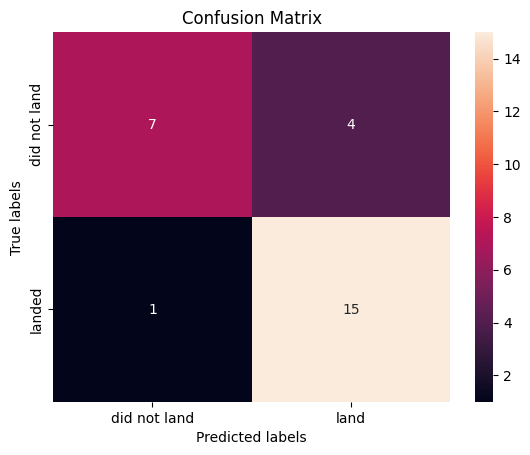

In [40]:
yhat = tree_cv.predict(x_test)
plot_confusion_matrix(y_test,yhat)

## 4) K Nearest Neighbor


In [41]:
parameters = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
              'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
              'p': [1,2]}
KNN = KNeighborsClassifier()

In [42]:
knn_cv=GridSearchCV(KNN,parameters,cv=10)
knn_cv.fit(x_train,y_train)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'p': [1, 2]})

In [44]:
print(knn_cv.best_params_)
knn_cv.best_score_

{'algorithm': 'auto', 'n_neighbors': 4, 'p': 1}


0.8928571428571429

#### adding first methos(KNN)on the lists

In [45]:
accu.append(knn_cv.score(x_test,y_test))
methods.append("K Nearest Neighbor")

In [46]:
accu

[0.8888888888888888,
 0.8888888888888888,
 0.8148148148148148,
 0.8518518518518519]

In [48]:
methods

['Logistic Regression',
 'Support Vector Machine',
 'Decision Tree Classifier',
 'K Nearest Neighbor']

## Confusion Matrix (for KNN)

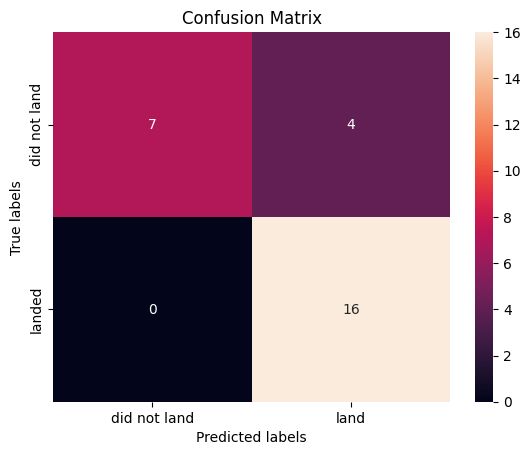

In [49]:
yhat = knn_cv.predict(x_test)
plot_confusion_matrix(y_test,yhat)


# Finding the best method performance:


In [50]:
print(methods)
print(accu)

['Logistic Regression', 'Support Vector Machine', 'Decision Tree Classifier', 'K Nearest Neighbor']
[0.8888888888888888, 0.8888888888888888, 0.8148148148148148, 0.8518518518518519]


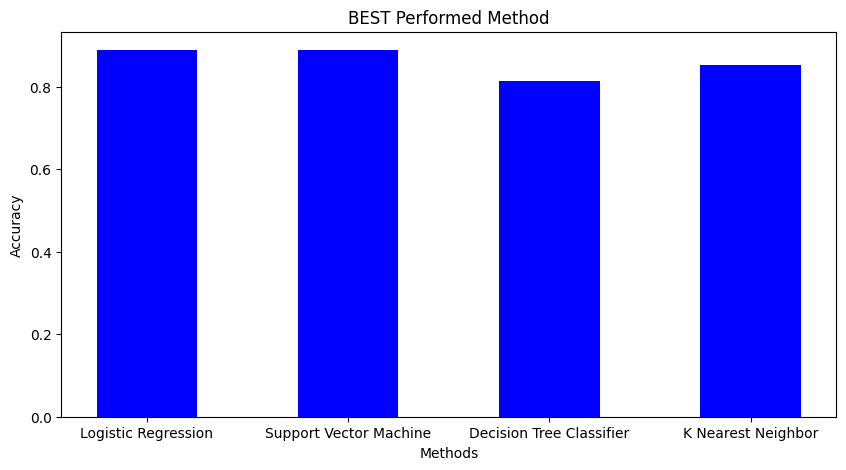

In [52]:
fig = plt.figure(figsize= (10, 5))

#creating the bar plot
plt.bar(methods, accu, color='blue', width= 0.5)

plt.xlabel('Methods')
plt.ylabel('Accuracy')
plt.title("BEST Performed Method")
plt.show()

## ROC Curve

In [53]:
from sklearn.metrics import RocCurveDisplay

Text(0.5, 1.0, 'Area Under ROC')

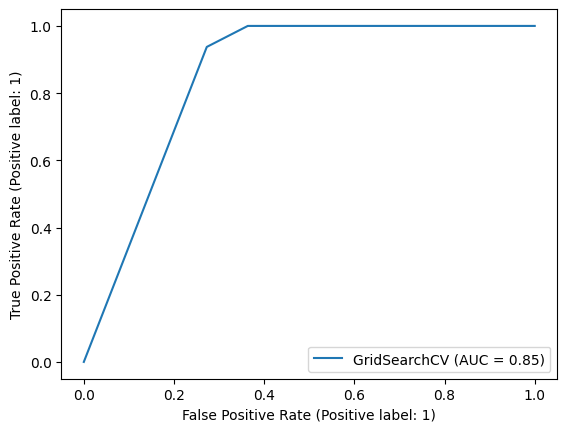

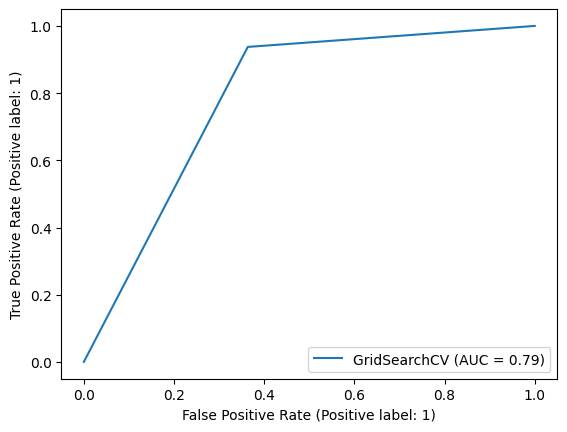

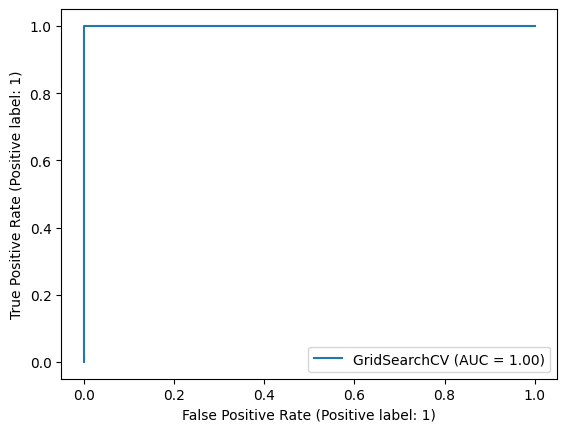

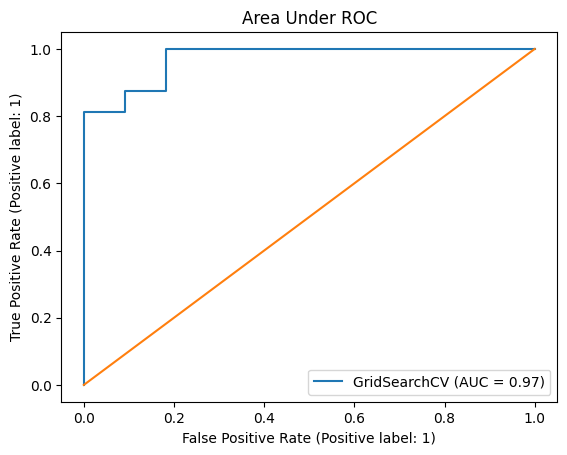

In [61]:
RocCurveDisplay.from_estimator(knn_cv,x_test,y_test)
RocCurveDisplay.from_estimator(tree_cv,x_test,y_test)
RocCurveDisplay.from_estimator(svm_cv,x_test,y_test)
RocCurveDisplay.from_estimator(logreg_cv,x_test,y_test)

plt.plot([0,1],[0,1])
plt.title('Area Under ROC')